<a href="https://colab.research.google.com/github/guswns3396/ICME-2023/blob/main/GAN_Exercise_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from torch.optim import Adam, SGD

import torchvision
from torchvision.datasets import MNIST
import torchvision.transforms as transforms

import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def get_device():
  if torch.cuda.is_available():
    return torch.device('cuda')
  else:
    return torch.device('cpu')

In [ ]:
device = get_device()
print(f"Device: {device}")

Device: cuda


In [ ]:
data_transform = transforms.Compose([transforms.ToTensor(),
                                     transforms.Normalize((0.5,), (0.5,))])

In [ ]:
data = MNIST(root = 'data/', train=True, download=True, transform=data_transform)

100%|██████████| 9912422/9912422 [00:00<00:00, 91927969.60it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 103712066.63it/s]


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 24710025.64it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 22679200.91it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



In [ ]:
data_loader = DataLoader(data, batch_size= 64, shuffle=True)

In [ ]:
def denorm(images, means=0.5, stds=0.5):
  images_standard = (images*stds)+means
  return images_standard

In [ ]:
for xb, yb in data_loader:
  print(xb.shape)
  print(yb.shape)
  break

torch.Size([64, 1, 28, 28])
torch.Size([64])


In [ ]:
def plot_images(xb):
  grid_img = torchvision.utils.make_grid(denorm(xb), nrow=8)
  plt.figure(figsize=(12,12))
  plt.imshow(grid_img.permute(1,2,0))


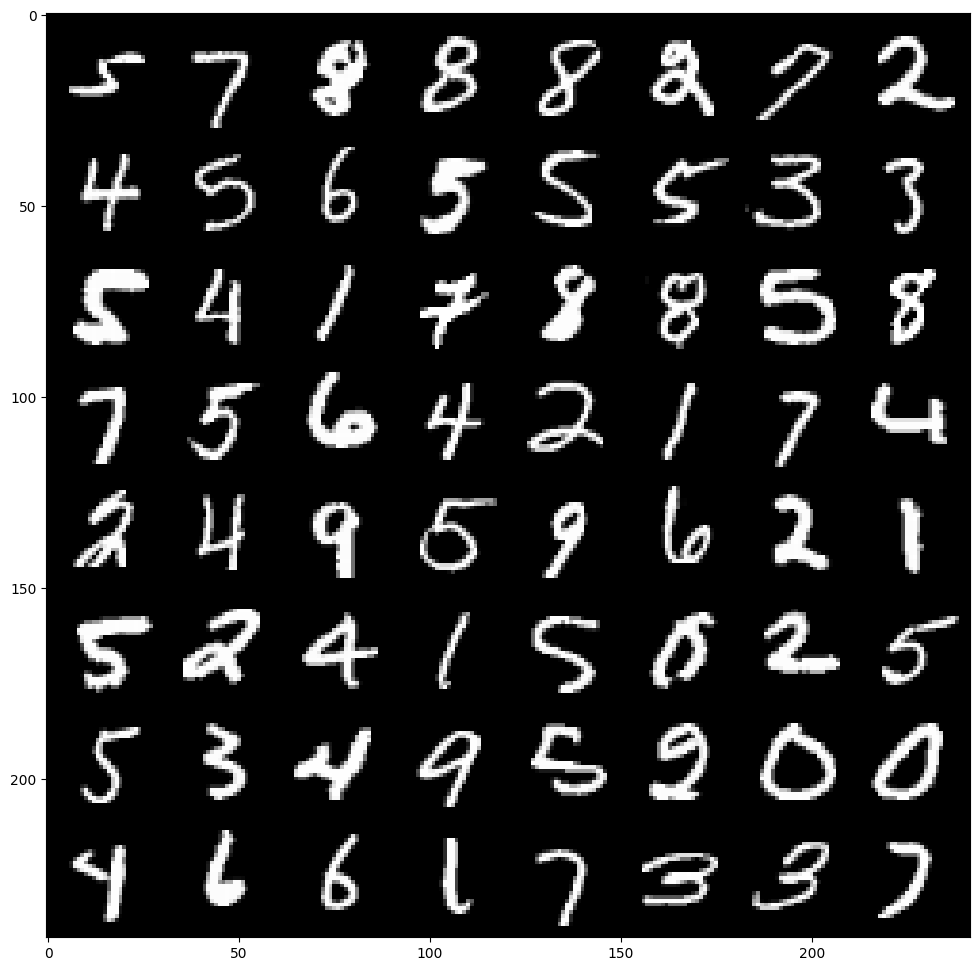

In [ ]:
plot_images(xb)


In [ ]:
class DiscriminatorModel(nn.Module):
  def __init__(self, input_size=784, output_size=1):
    super().__init__()
    self.layer1 = nn.Linear(input_size, 256)
    self.layer2 = nn.Linear(256, 256)
    self.layer3 = nn.Linear(256,1)
    self.relu = nn.ReLU()

  def forward(self, xb):
    x = torch.reshape(xb, (xb.shape[0], -1))
    x = self.relu(self.layer1(x))
    x = self.relu(self.layer2(x))
    return self.layer3(x)

In [ ]:
discriminator = DiscriminatorModel()
temp = discriminator(xb)
print(temp.shape)

torch.Size([64, 1])


In [ ]:
latent_dimension = 64

In [ ]:
class GeneratorModel(nn.Module):
  def __init__(self, target_size=784, latent_size=64):
    super().__init__()
    self.layer1 = nn.Linear(latent_size, 256)
    self.layer2 = nn.Linear(256, 256)
    self.layer3 = nn.Linear(256, target_size)
    self.relu = nn.ReLU()
    self.tanh = nn.Tanh()

  def forward(self, v):
    x = self.relu(self.layer1(v))
    x = self.relu(self.layer2(x))
    x = self.tanh(self.layer3(x))
    return torch.reshape(x, (x.shape[0], 1, 28, 28))

In [ ]:
generator = GeneratorModel()
test_vec = torch.randn((10,64))
temp = generator(test_vec)
print(temp.shape)

torch.Size([10, 1, 28, 28])


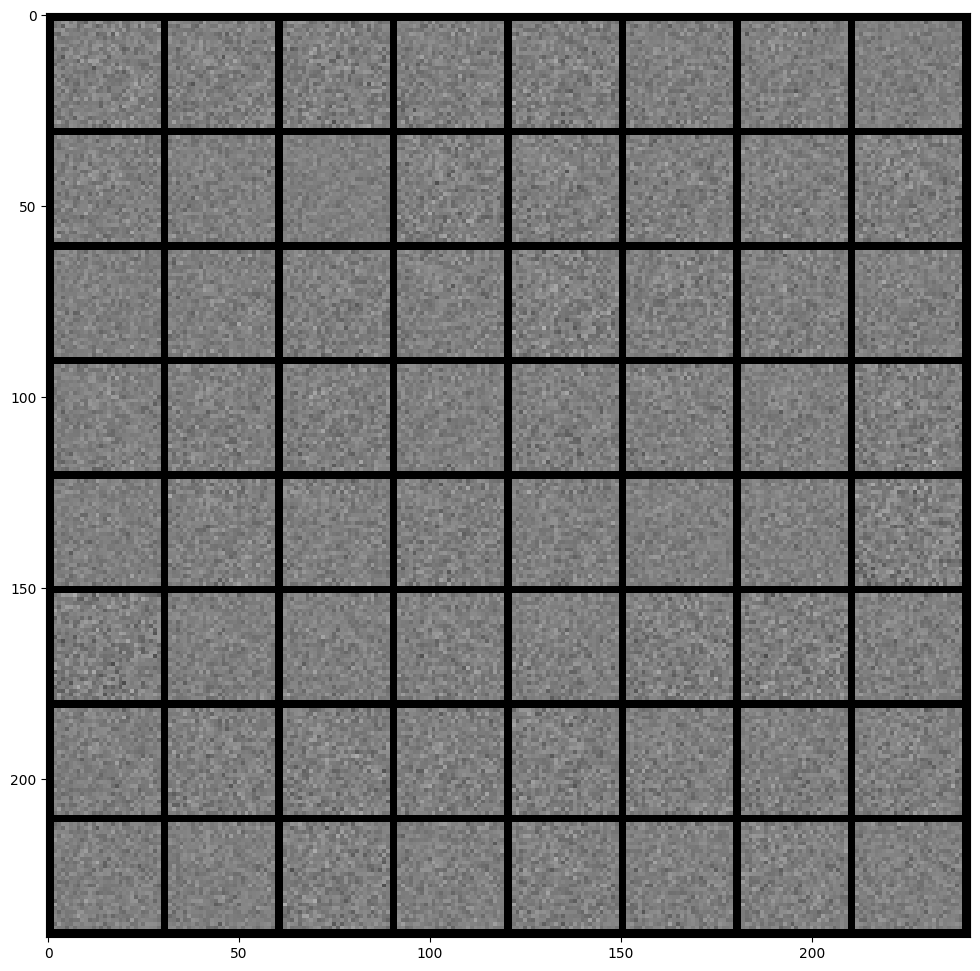

In [ ]:
batched_test_vector = torch.randn((64,64))
test_images = generator(batched_test_vector)
plot_images(test_images)

In [ ]:
def discriminator_training_step(real_images, disc_opt):
  num = real_images.shape[0]
  criterion = torch.nn.BCEWithLogitsLoss()
  disc_opt.zero_grad()


  real_targets = torch.ones(num, 1, device=device)
  real_predictions = discriminator(real_images)
  real_loss = criterion(real_predictions, real_targets)


  batched_random_vector = torch.randn((num, latent_dimension), device=device)
  fake_images = generator(batched_random_vector)
  fake_targets = torch.zeros(num, 1, device=device)
  fake_predictions = discriminator(fake_images)
  fake_loss = criterion(fake_predictions, fake_targets)

  loss = real_loss + fake_loss
  loss.backward()
  disc_opt.step()

  return loss.detach().item()

In [ ]:
def generator_training_step(gen_opt, batch_size=64):
  criterion = torch.nn.BCEWithLogitsLoss()
  gen_opt.zero_grad()

  batched_random_vector = torch.randn((batch_size, latent_dimension), device=device)
  fake_images = generator(batched_random_vector)
  targets = torch.ones(batch_size, 1, device=device)
  predictions = discriminator(fake_images)
  loss = criterion(predictions, targets)

  loss.backward()
  gen_opt.step()

  return loss.detach().item()

In [ ]:
def train_models(epochs=50, lr=0.0002):
  gen_opt = torch.optim.Adam(generator.parameters(), lr=lr)
  disc_opt = torch.optim.Adam(discriminator.parameters(), lr=lr)


  for epoch in range(epochs):
    gen_losses = []
    disc_losses = []

    for real_images, _ in data_loader:
      real_images = real_images.to(device)
      disc_loss = discriminator_training_step(real_images, disc_opt)
      gen_loss = generator_training_step(gen_opt)

      gen_losses.append(gen_loss)
      disc_losses.append(disc_loss)

    gen_epoch_loss = torch.tensor(gen_losses).mean().item()
    disc_epoch_loss = torch.tensor(disc_losses).mean().item()

    print(F"Epoch: {epoch+1} \t Disc Loss: {disc_epoch_loss} \t Gen Loss: {gen_epoch_loss}")

    generator.eval()
    fake_images = generator(fixed_random_vector)
    grid_img = torchvision.utils.make_grid(denorm(fake_images.detach().cpu()), nrow=8)
    plt.figure(figsize=(8,8))
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()
    generator.train()

In [ ]:
fixed_random_vector = torch.randn((64, latent_dimension), device=device)
generator = GeneratorModel().to(device)
discriminator = DiscriminatorModel().to(device)

Epoch: 1 	 Disc Loss: 0.33822280168533325 	 Gen Loss: 3.3359243869781494


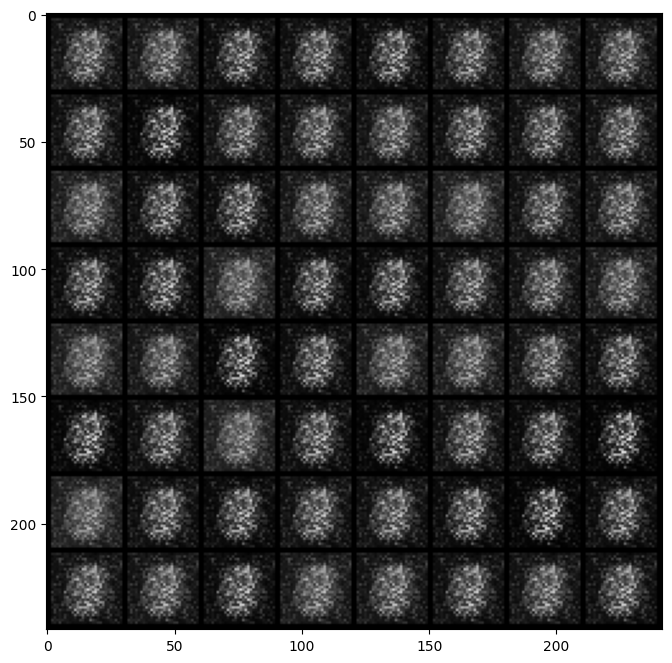

Epoch: 2 	 Disc Loss: 0.7579609751701355 	 Gen Loss: 2.404510974884033


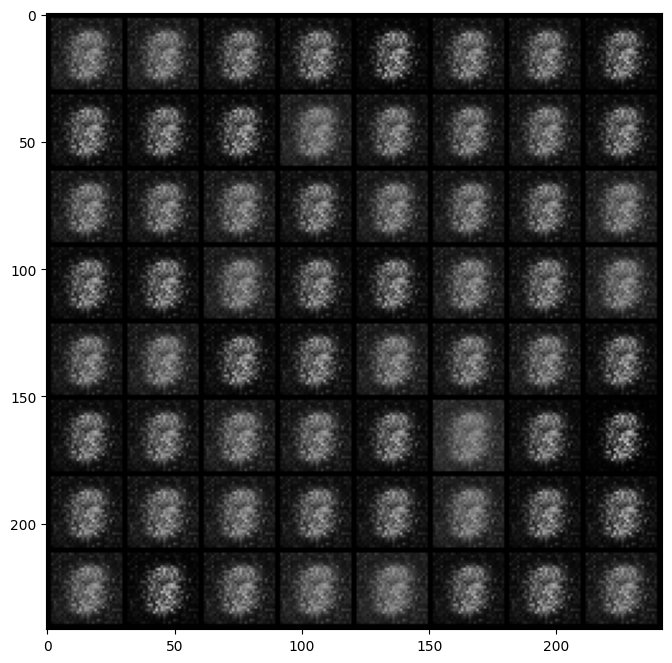

Epoch: 3 	 Disc Loss: 1.0376774072647095 	 Gen Loss: 1.9298717975616455


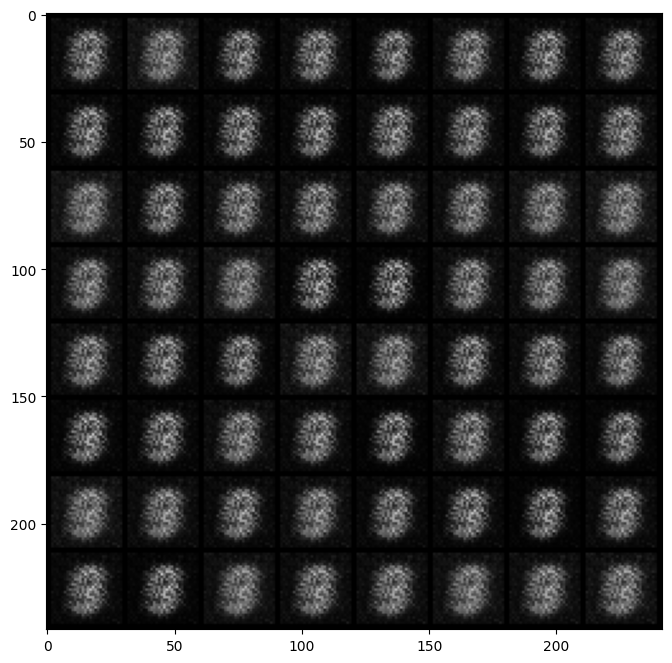

Epoch: 4 	 Disc Loss: 1.1973378658294678 	 Gen Loss: 1.6079949140548706


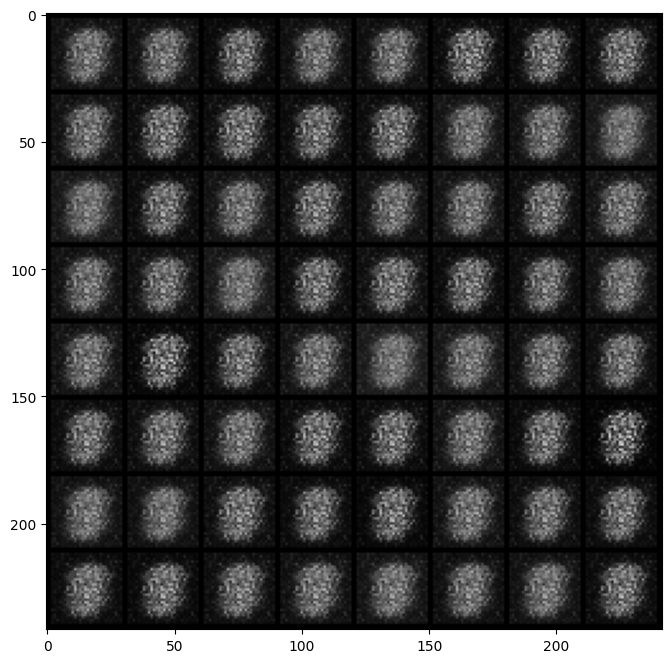

Epoch: 5 	 Disc Loss: 1.243611216545105 	 Gen Loss: 1.4065766334533691


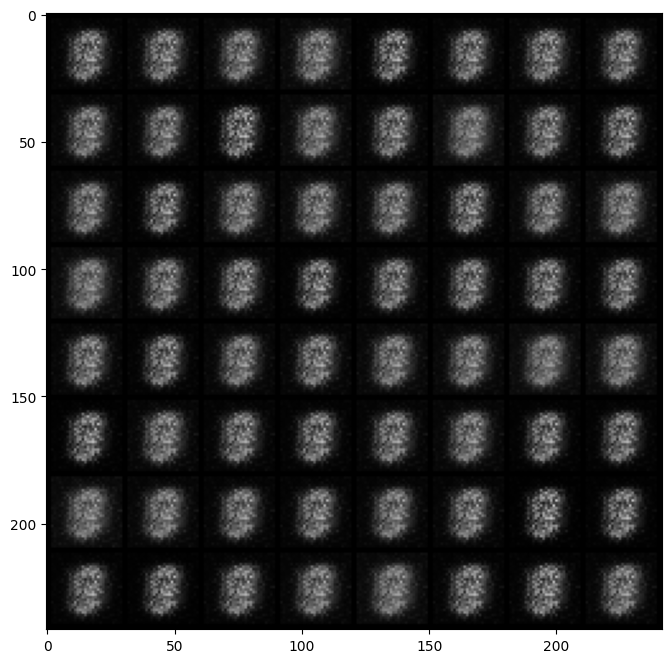

Epoch: 6 	 Disc Loss: 1.1291890144348145 	 Gen Loss: 1.3828260898590088


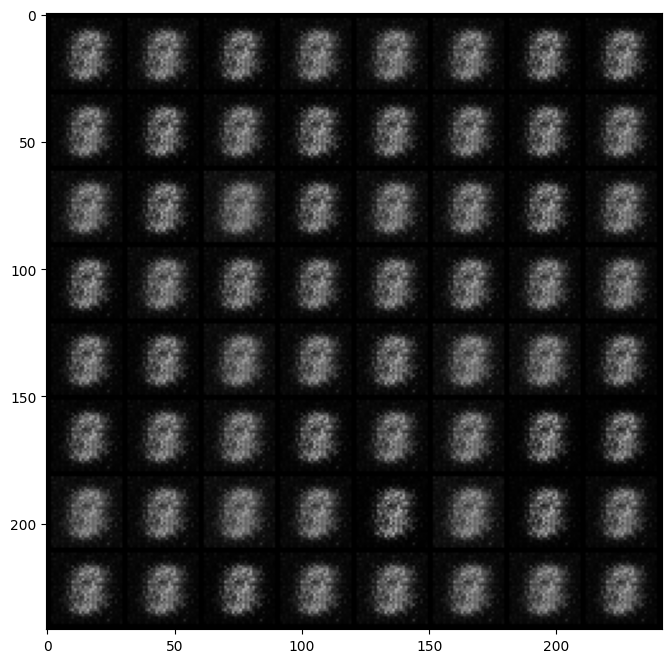

Epoch: 7 	 Disc Loss: 0.8244919776916504 	 Gen Loss: 1.7579323053359985


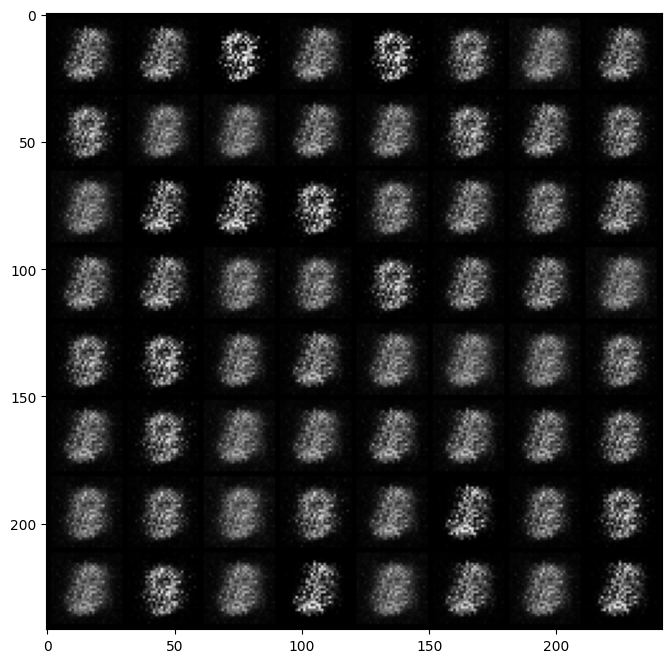

Epoch: 8 	 Disc Loss: 1.0375312566757202 	 Gen Loss: 1.6352089643478394


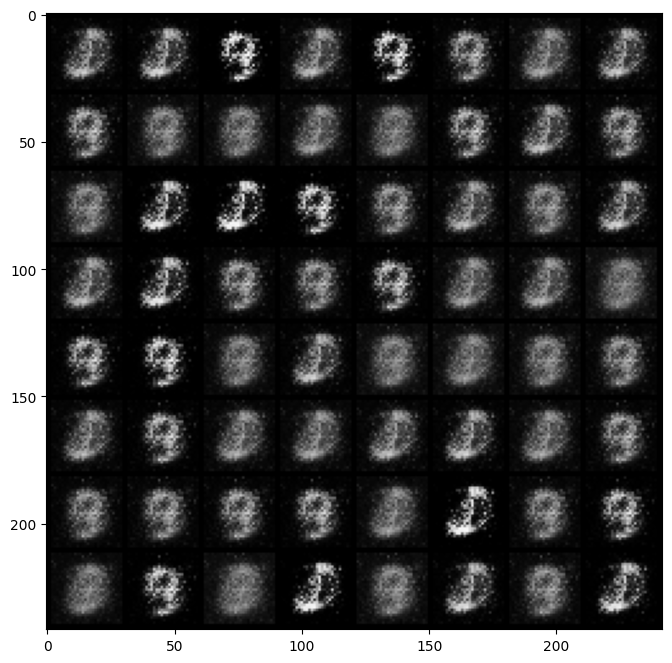

Epoch: 9 	 Disc Loss: 1.2406373023986816 	 Gen Loss: 1.3411675691604614


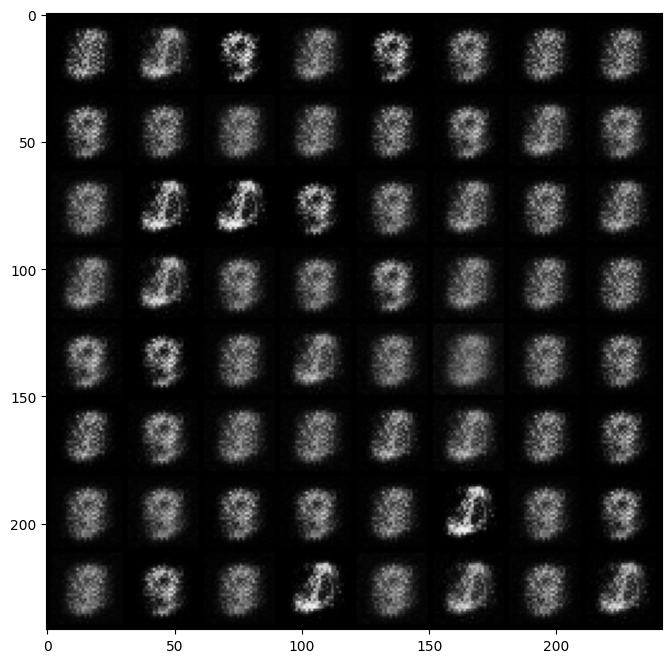

Epoch: 10 	 Disc Loss: 1.1797996759414673 	 Gen Loss: 1.1090601682662964


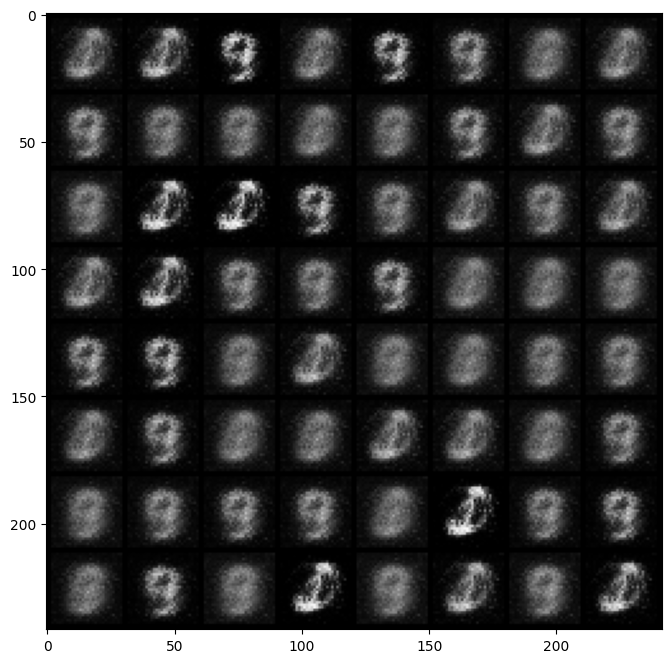

Epoch: 11 	 Disc Loss: 0.7632941603660583 	 Gen Loss: 1.6045911312103271


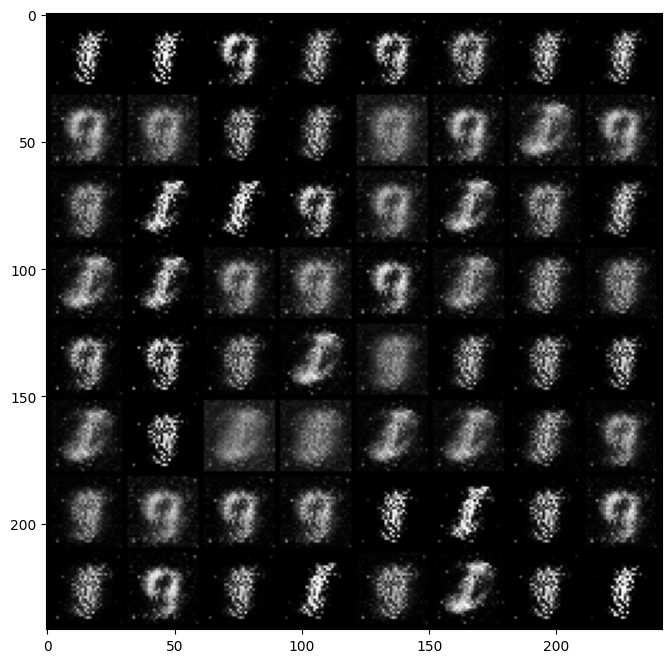

Epoch: 12 	 Disc Loss: 0.5319446921348572 	 Gen Loss: 2.524108648300171


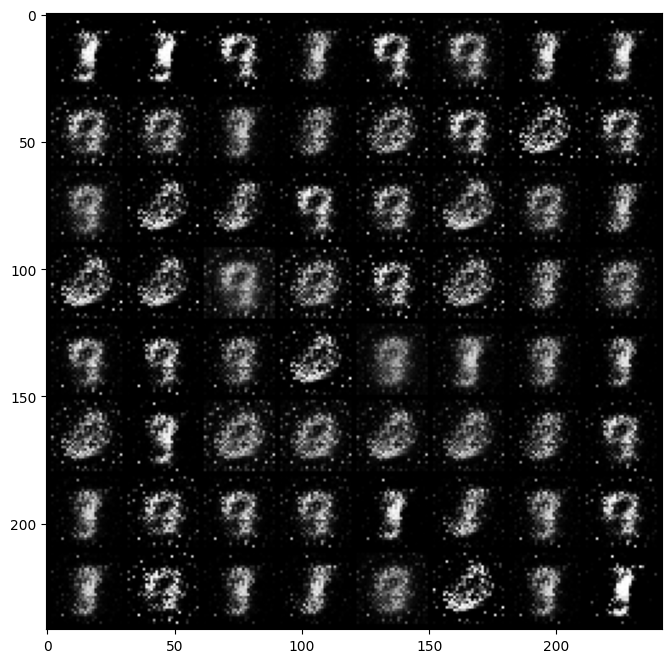

Epoch: 13 	 Disc Loss: 0.4981924295425415 	 Gen Loss: 2.6048471927642822


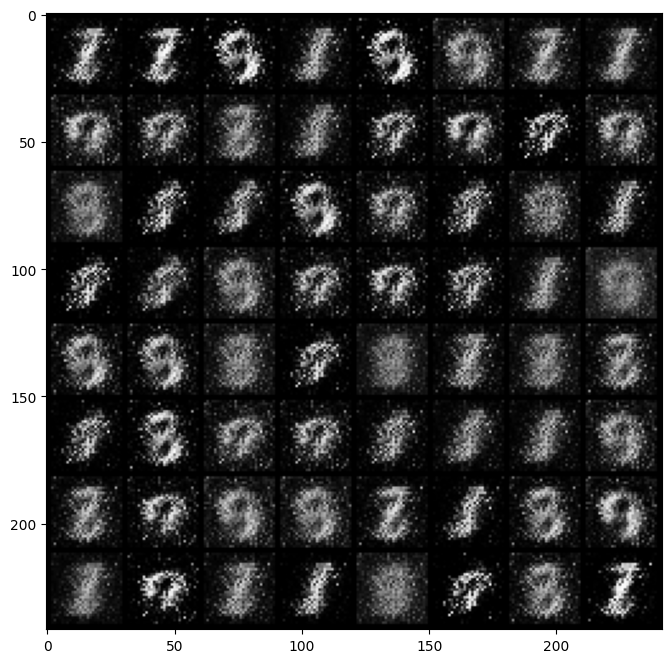

Epoch: 14 	 Disc Loss: 0.6692268252372742 	 Gen Loss: 2.240689277648926


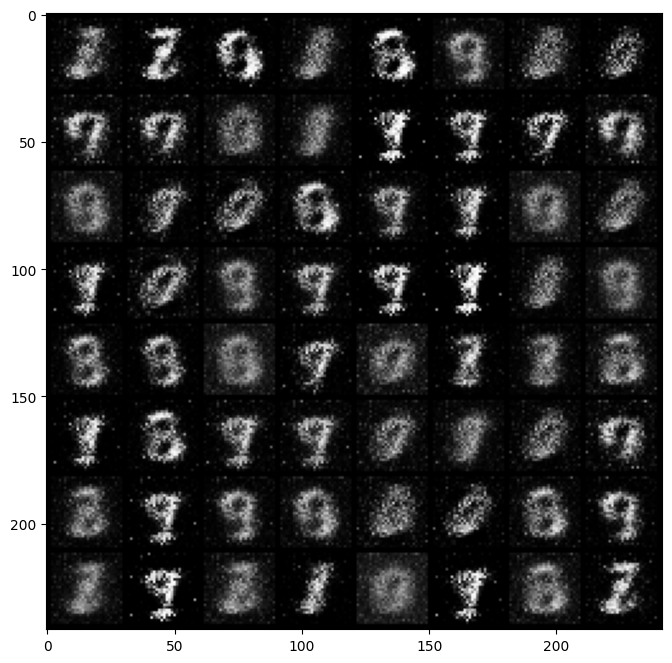

Epoch: 15 	 Disc Loss: 0.7285872101783752 	 Gen Loss: 2.327014207839966


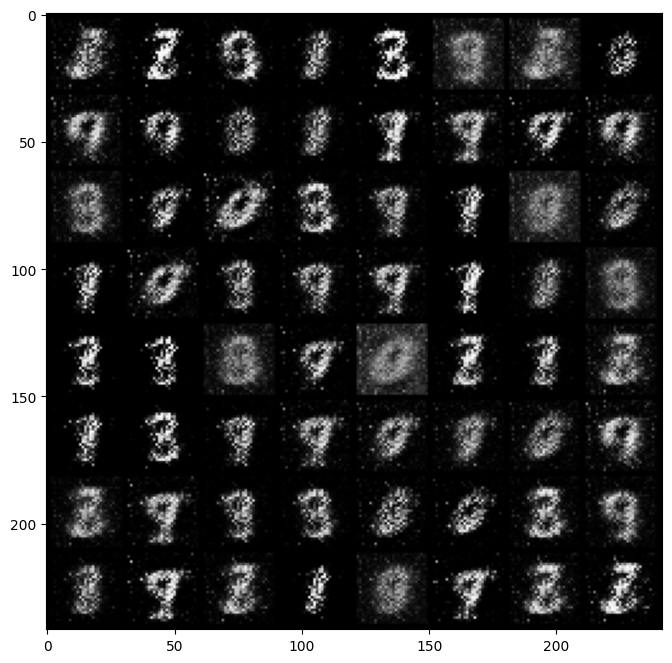

Epoch: 16 	 Disc Loss: 0.8987483978271484 	 Gen Loss: 2.0272486209869385


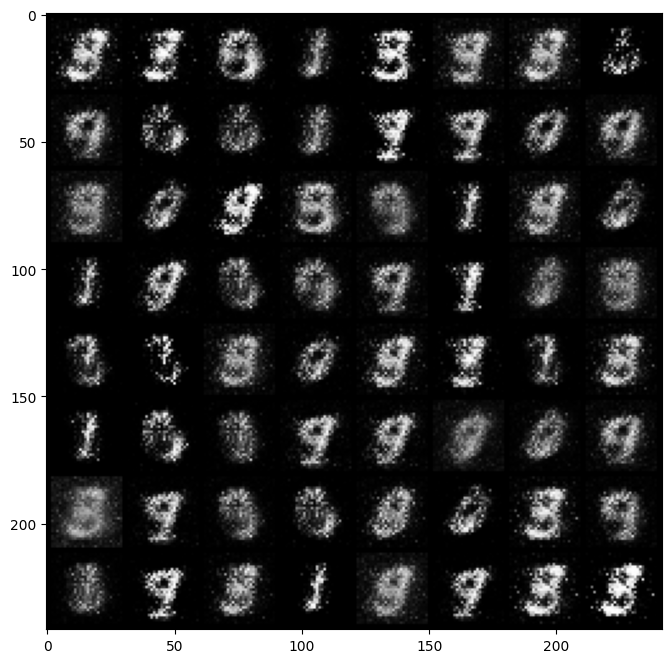

Epoch: 17 	 Disc Loss: 0.6798986792564392 	 Gen Loss: 1.941617488861084


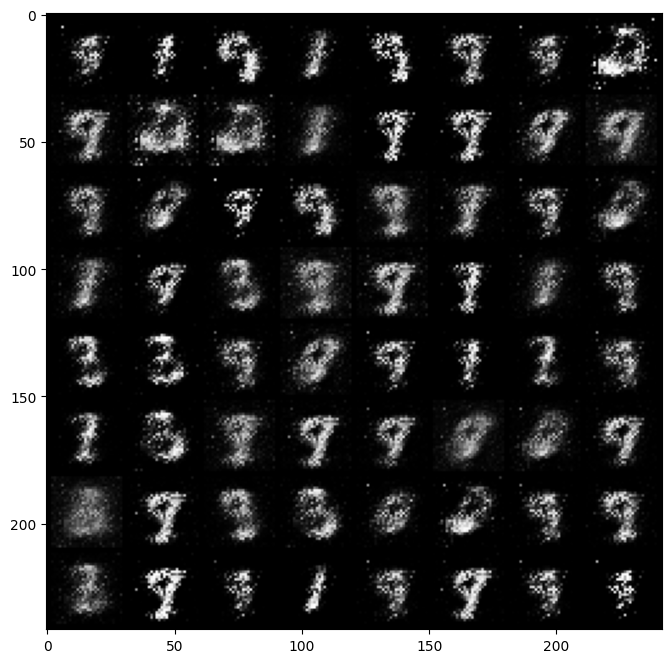

Epoch: 18 	 Disc Loss: 0.5927219390869141 	 Gen Loss: 1.9626086950302124


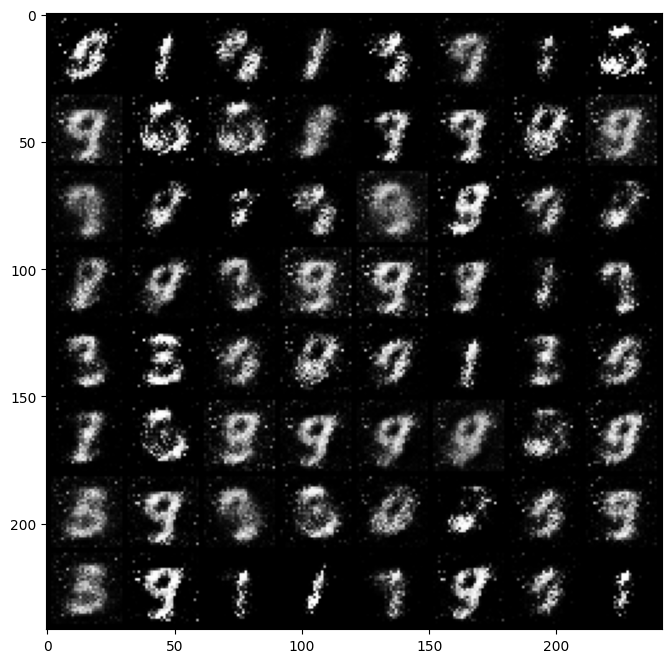

Epoch: 19 	 Disc Loss: 0.538023054599762 	 Gen Loss: 2.473289728164673


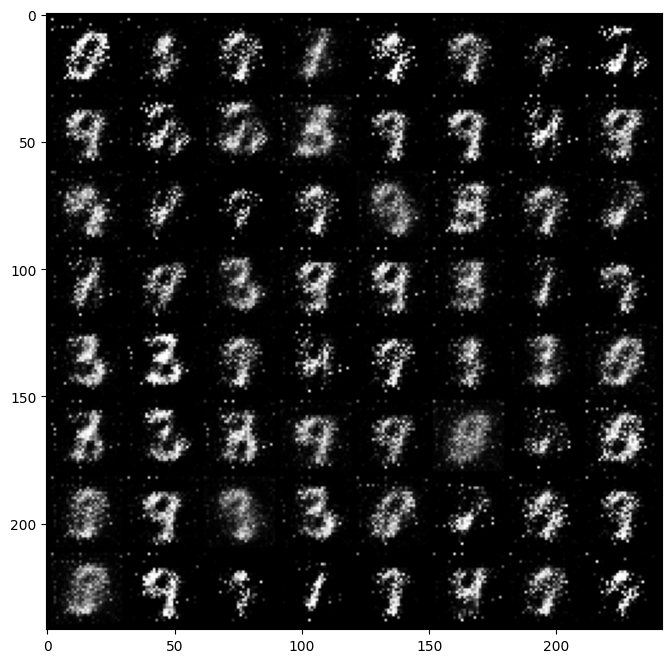

Epoch: 20 	 Disc Loss: 0.5521703958511353 	 Gen Loss: 2.7713897228240967


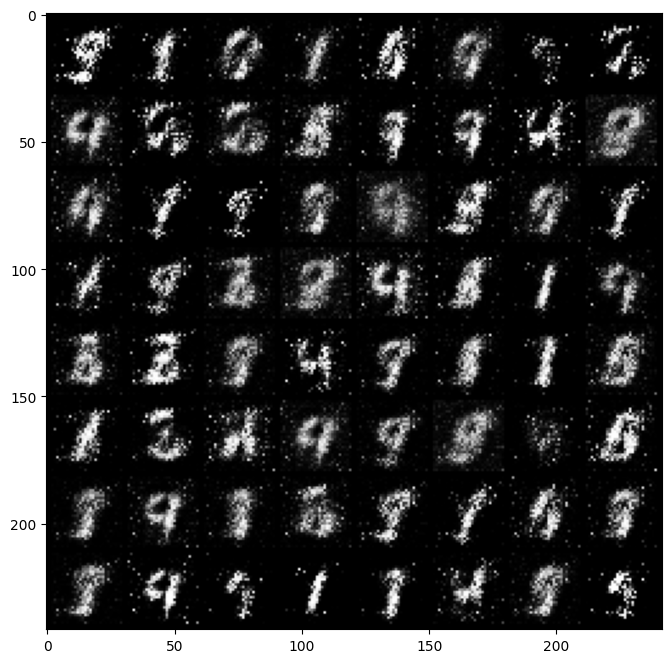

Epoch: 21 	 Disc Loss: 0.6186777353286743 	 Gen Loss: 2.7071104049682617


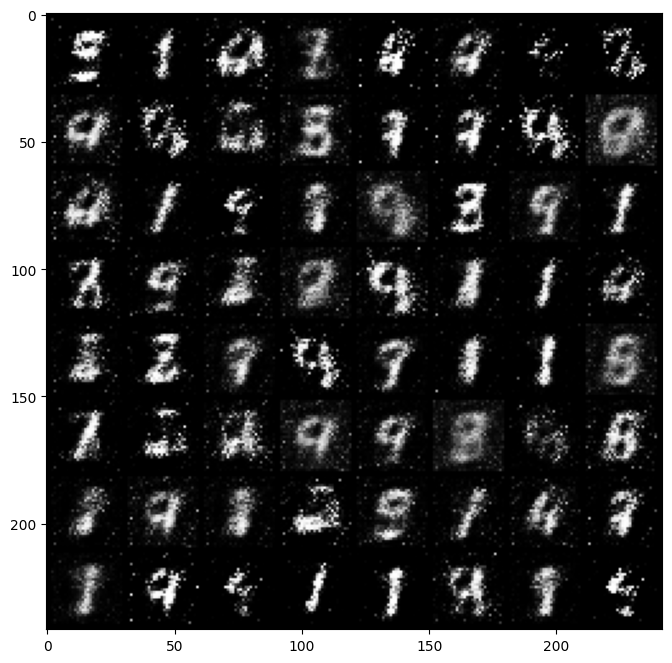

Epoch: 22 	 Disc Loss: 0.6698076725006104 	 Gen Loss: 2.32429575920105


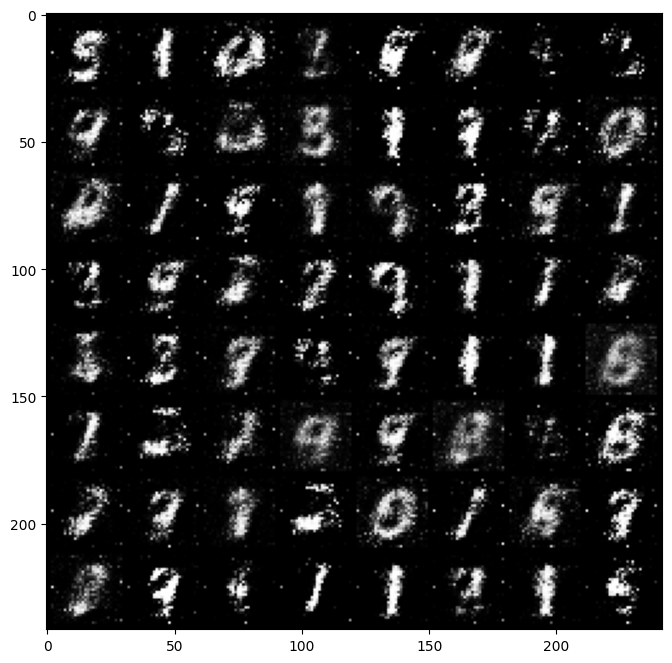

Epoch: 23 	 Disc Loss: 0.6510248780250549 	 Gen Loss: 2.3520455360412598


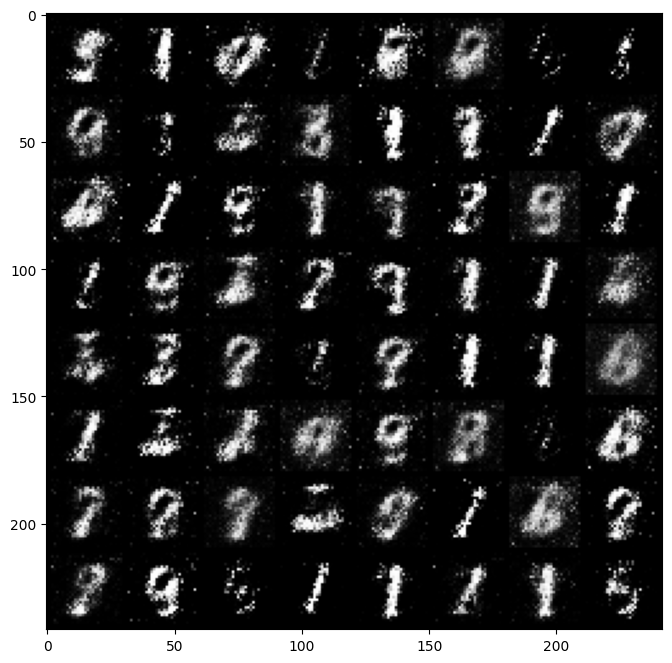

Epoch: 24 	 Disc Loss: 0.656735897064209 	 Gen Loss: 2.1645538806915283


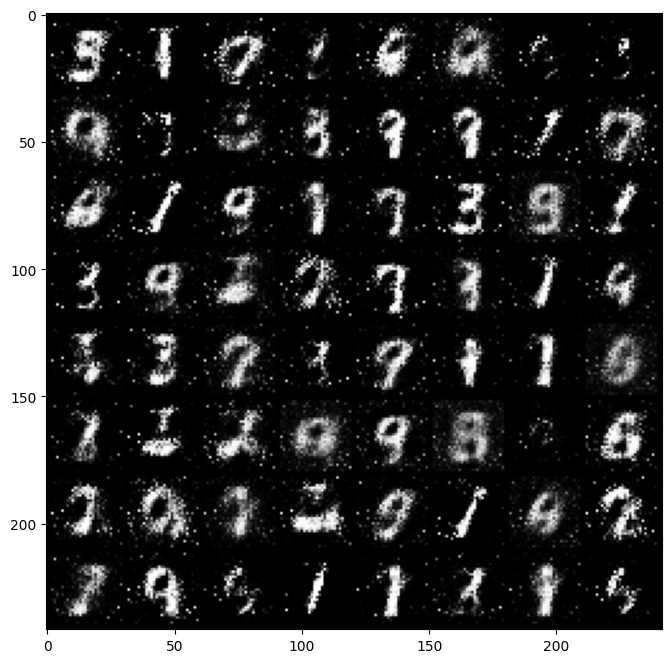

Epoch: 25 	 Disc Loss: 0.6527428030967712 	 Gen Loss: 2.216094970703125


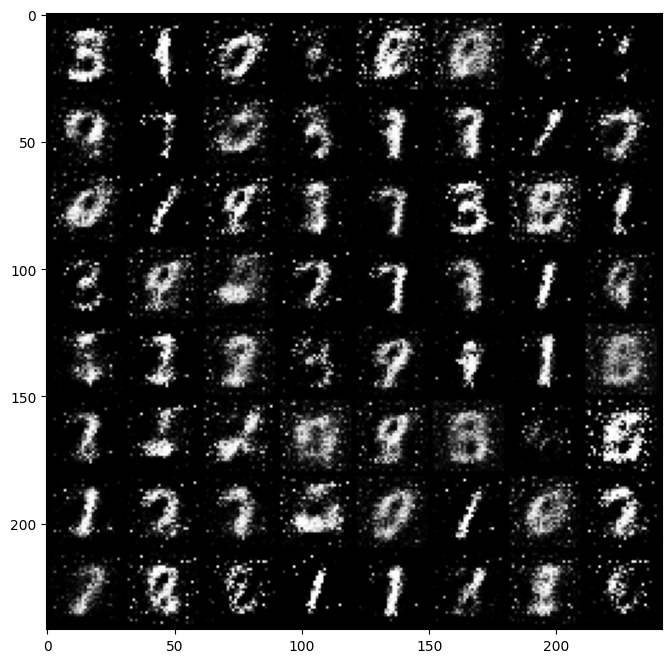

Epoch: 26 	 Disc Loss: 0.5888014435768127 	 Gen Loss: 2.697300910949707


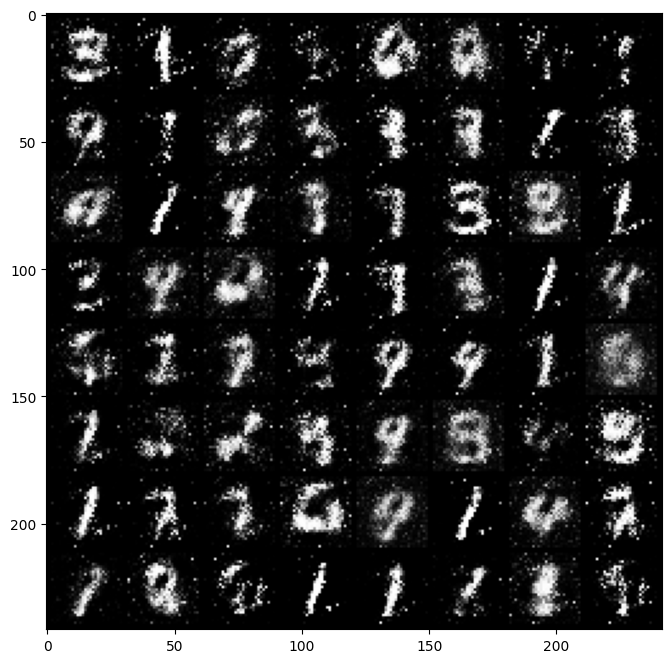

Epoch: 27 	 Disc Loss: 0.5965144038200378 	 Gen Loss: 2.4861836433410645


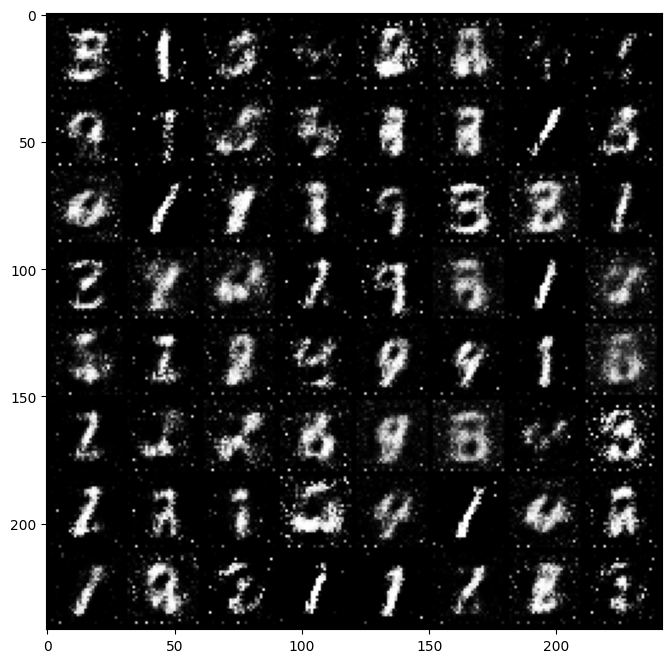

Epoch: 28 	 Disc Loss: 0.6031691431999207 	 Gen Loss: 2.259687900543213


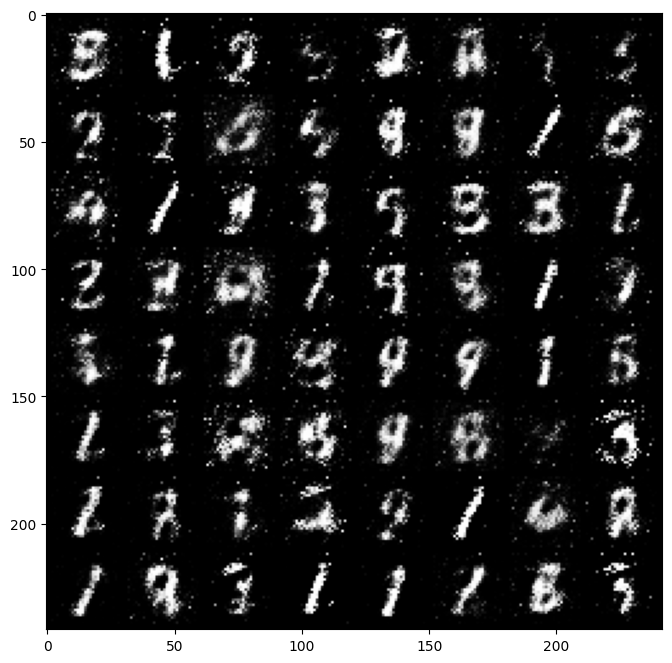

Epoch: 29 	 Disc Loss: 0.7413988709449768 	 Gen Loss: 2.1882100105285645


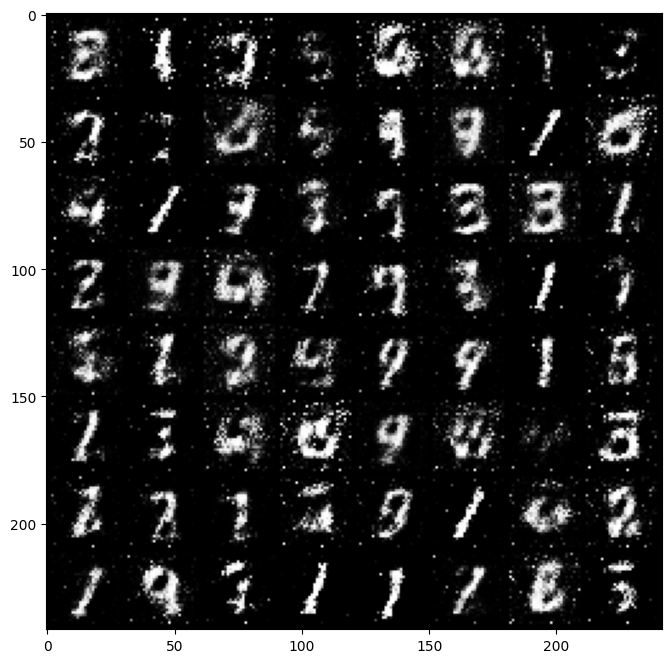

Epoch: 30 	 Disc Loss: 0.7260554432868958 	 Gen Loss: 2.1259822845458984


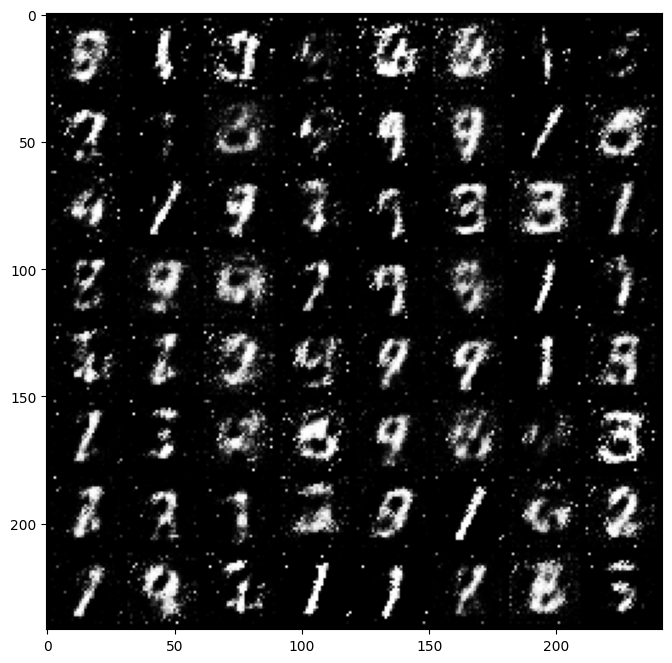

Epoch: 31 	 Disc Loss: 0.774340808391571 	 Gen Loss: 2.018601894378662


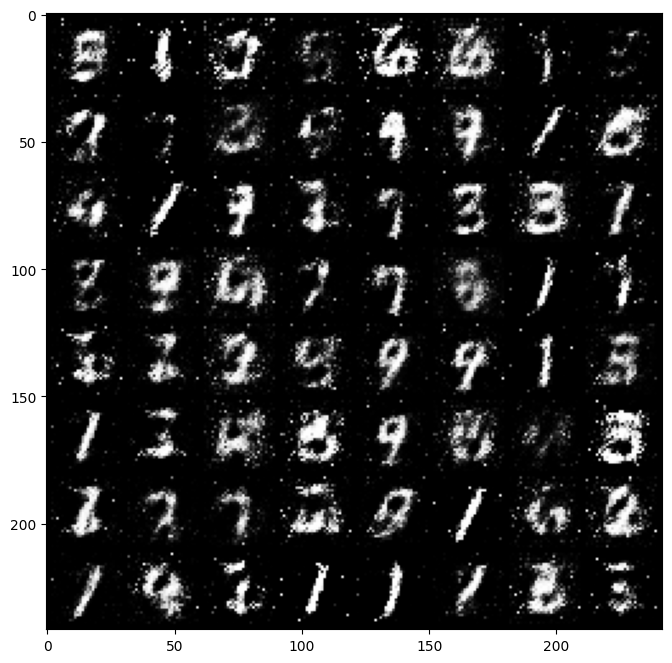

Epoch: 32 	 Disc Loss: 0.7722267508506775 	 Gen Loss: 2.0275065898895264


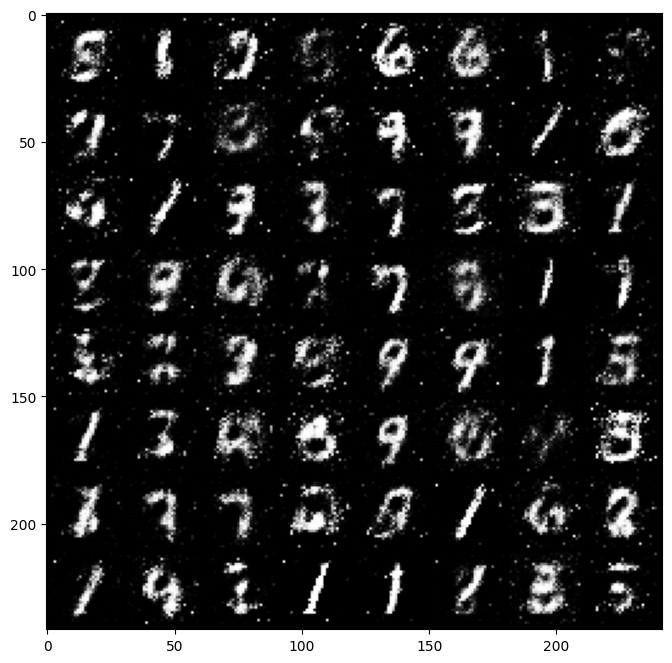

Epoch: 33 	 Disc Loss: 0.7500998973846436 	 Gen Loss: 2.0951476097106934


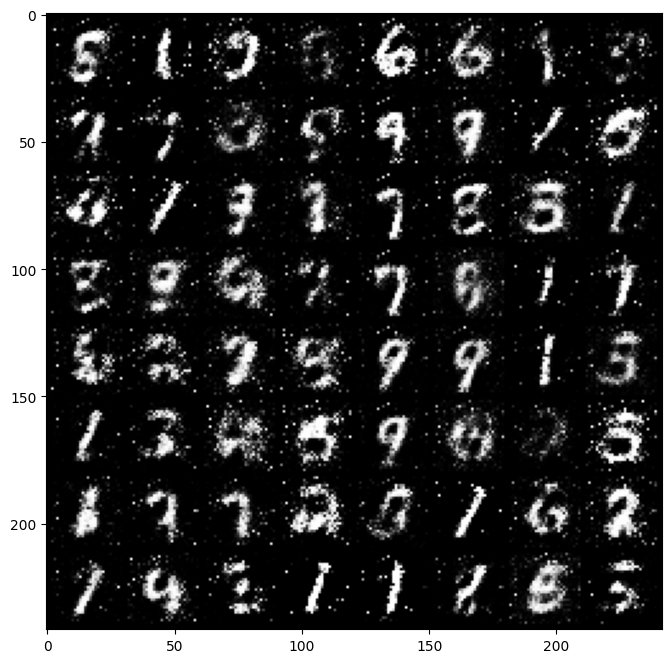

Epoch: 34 	 Disc Loss: 0.7485292553901672 	 Gen Loss: 2.1716177463531494


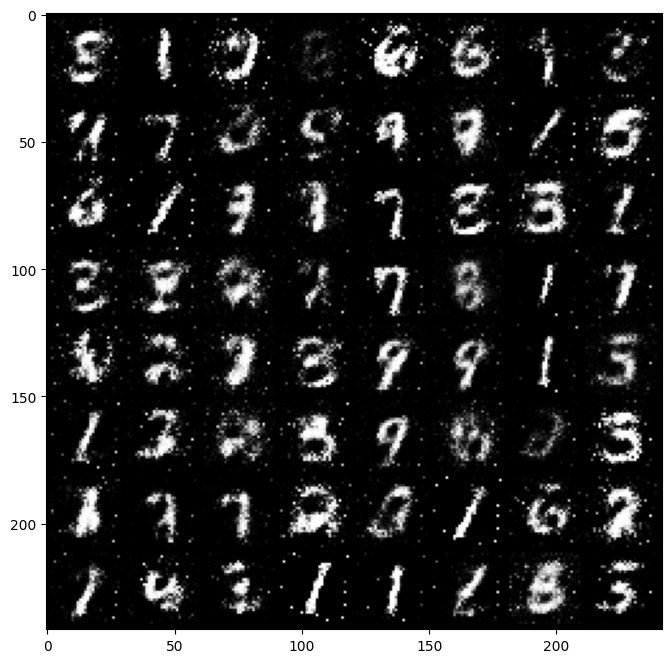

Epoch: 35 	 Disc Loss: 0.768368661403656 	 Gen Loss: 2.0098369121551514


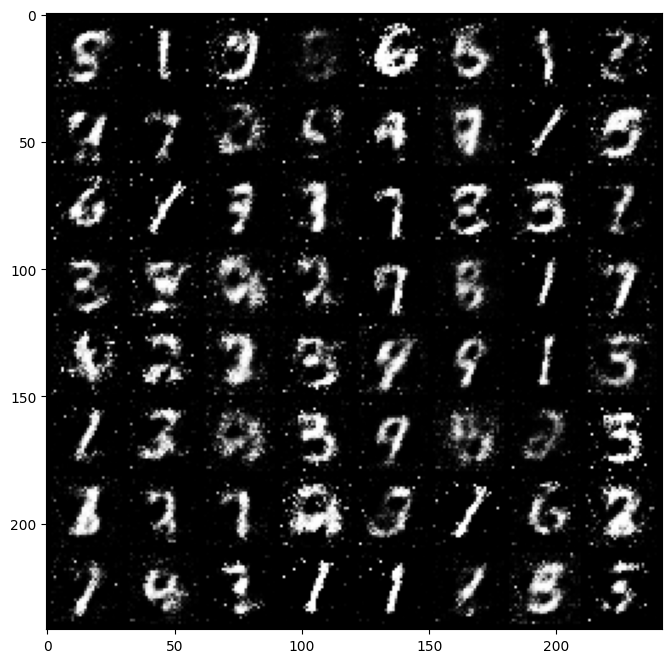

Epoch: 36 	 Disc Loss: 0.7736210823059082 	 Gen Loss: 1.9601010084152222


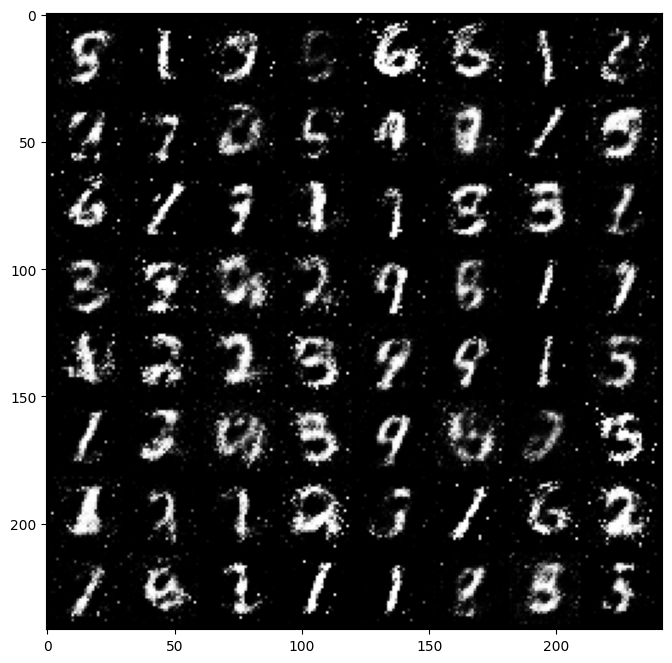

Epoch: 37 	 Disc Loss: 0.7941224575042725 	 Gen Loss: 1.9183719158172607


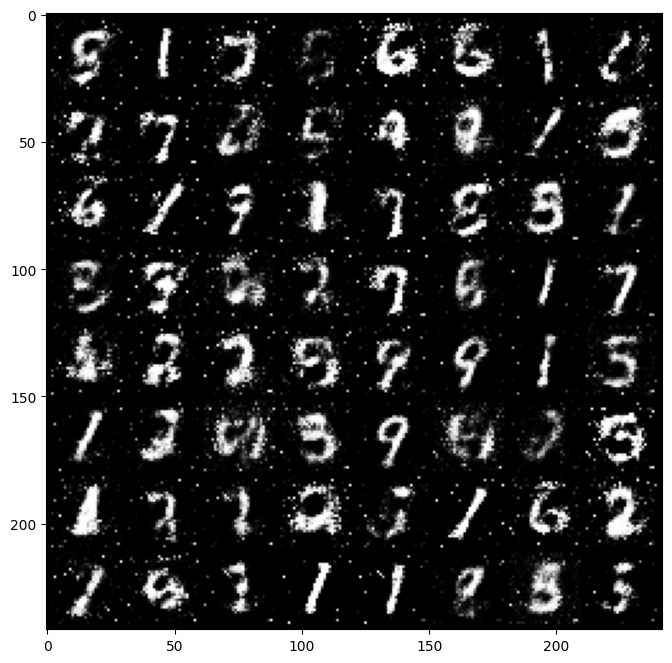

Epoch: 38 	 Disc Loss: 0.736661434173584 	 Gen Loss: 2.088634967803955


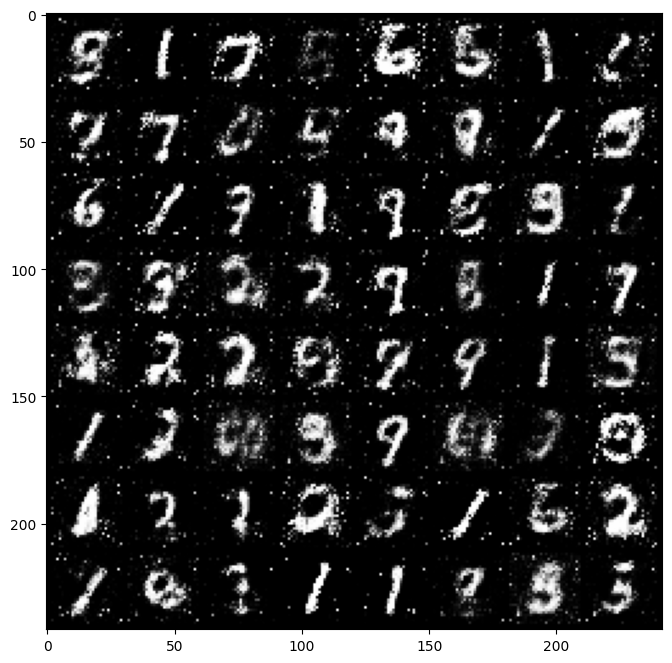

Epoch: 39 	 Disc Loss: 0.7316916584968567 	 Gen Loss: 2.0168187618255615


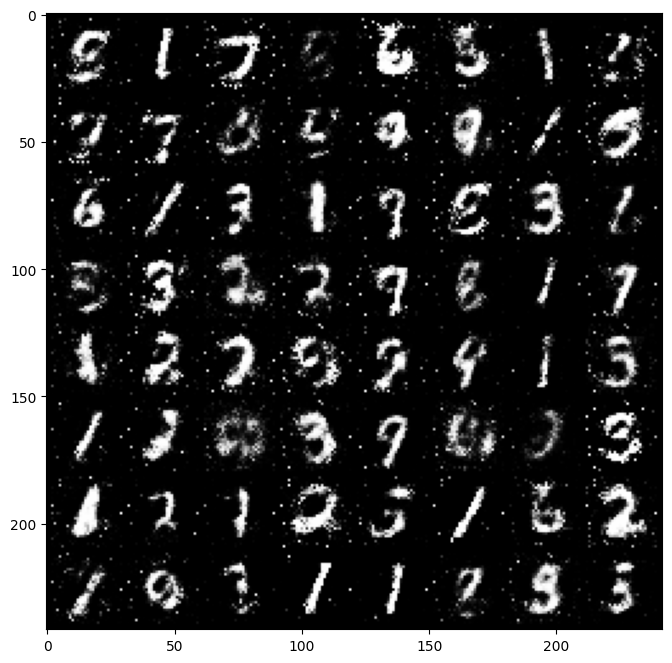

Epoch: 40 	 Disc Loss: 0.7090981006622314 	 Gen Loss: 2.097993850708008


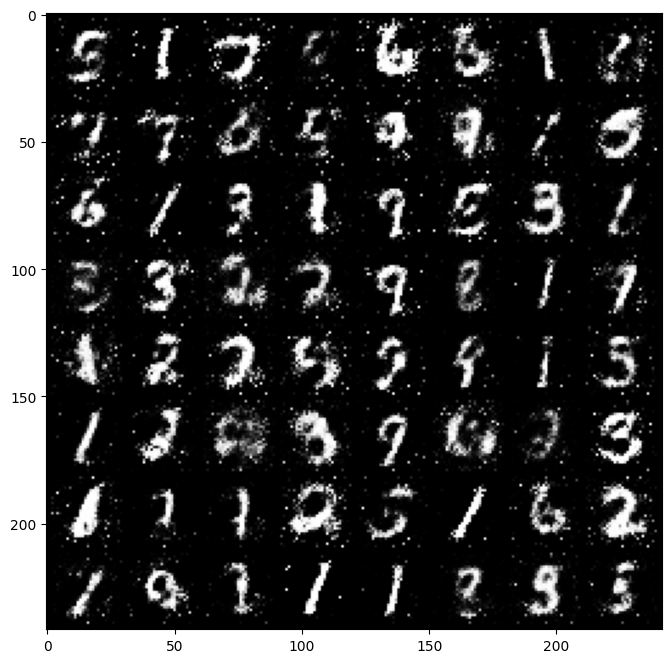

Epoch: 41 	 Disc Loss: 0.7258347868919373 	 Gen Loss: 2.0847861766815186


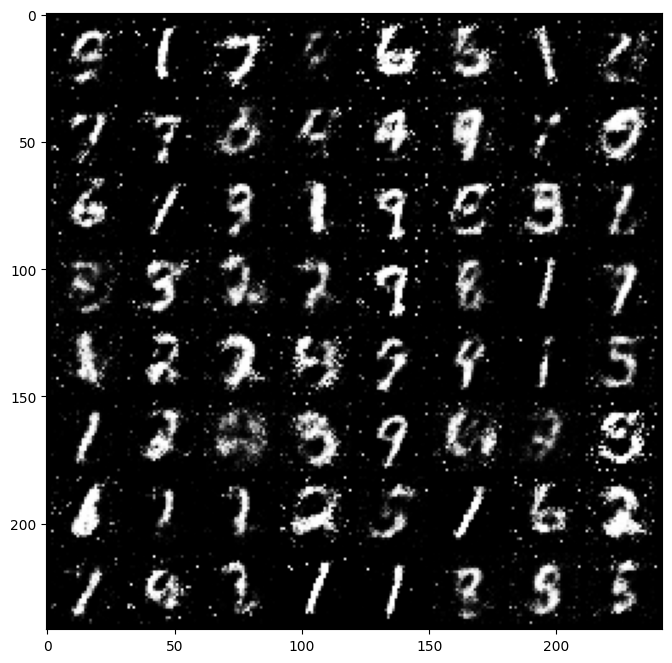

Epoch: 42 	 Disc Loss: 0.7596855759620667 	 Gen Loss: 1.991268515586853


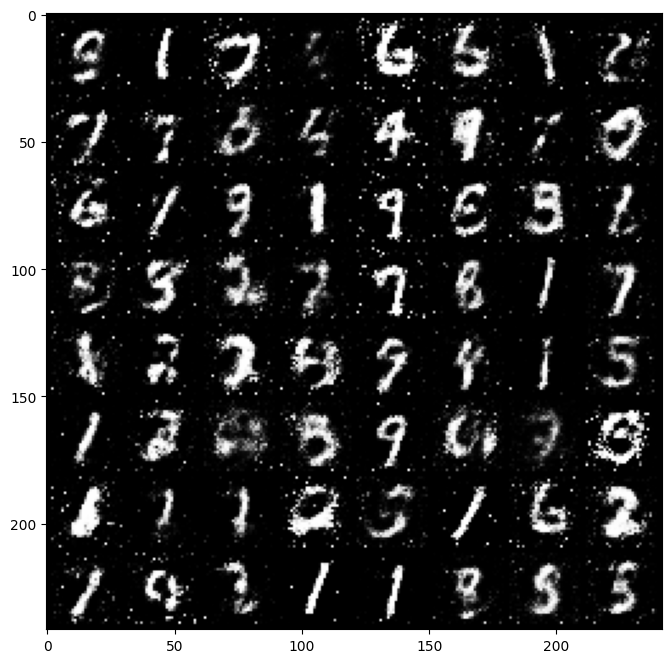

Epoch: 43 	 Disc Loss: 0.7712615132331848 	 Gen Loss: 1.8861974477767944


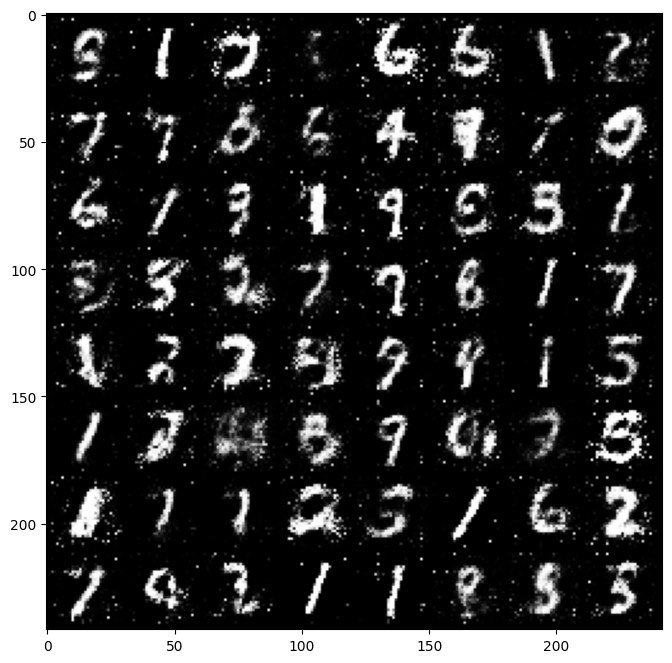

Epoch: 44 	 Disc Loss: 0.7901203632354736 	 Gen Loss: 1.84939444065094


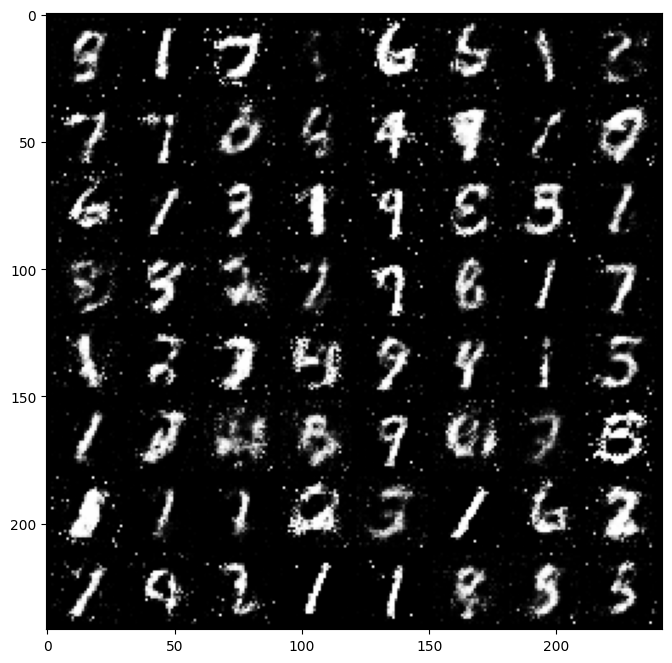

Epoch: 45 	 Disc Loss: 0.7775633335113525 	 Gen Loss: 1.8470278978347778


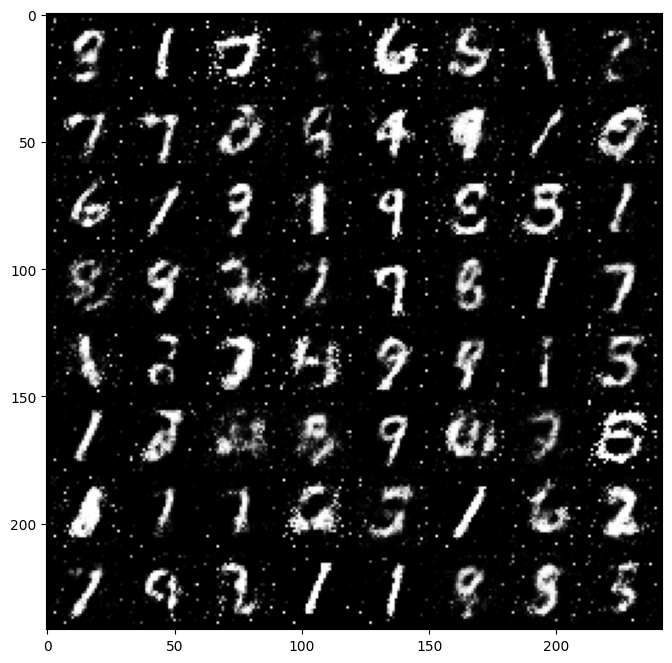

Epoch: 46 	 Disc Loss: 0.7835681438446045 	 Gen Loss: 1.8793030977249146


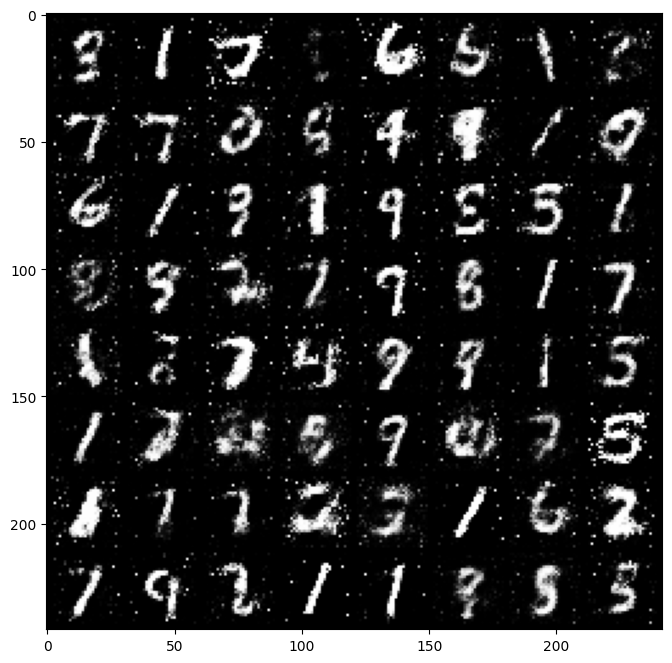

Epoch: 47 	 Disc Loss: 0.7939902544021606 	 Gen Loss: 1.8478894233703613


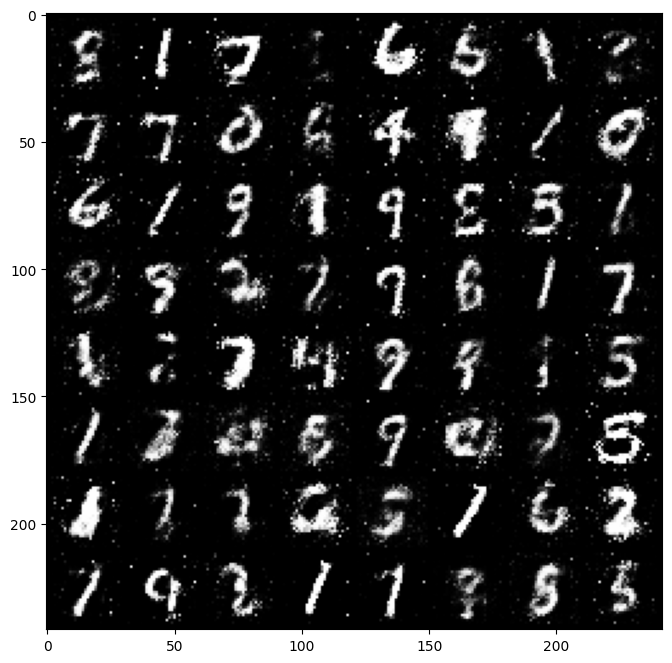

Epoch: 48 	 Disc Loss: 0.7999320030212402 	 Gen Loss: 1.7791657447814941


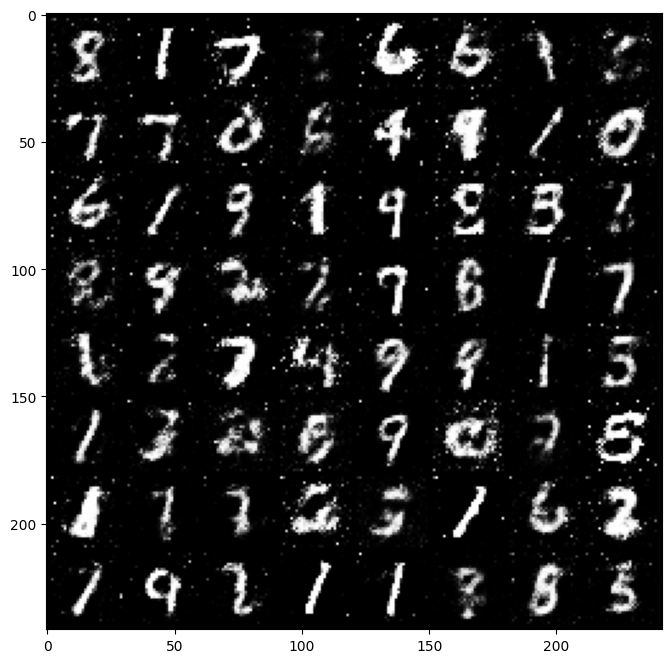

In [ ]:
train_models(epochs=50)

##Exercise:
1) You can see that we have used the old faithful Rectified Linear Unit as the activation function in the discriminator. This is not the best practice. In literature, it is recommended that we use a Leaky Rectified Linear Unit (Leaky ReLU), as the activation in the discriminator. The leaky relu, instead of supressing negative outputs to 0, only supressed them to a lower value.
Please look into the leaky at https://pytorch.org/docs/stable/generated/torch.nn.LeakyReLU.html.

2) Replace the activation in the discriminator above with a leaky relu. Run the models from scract and see if your outputs improve. You can use 0.2 as the negative slope...or experiment :)

3) Can you explain the change in the model's performance?



In [ ]:
import torch.nn as nn

# Define the Leaky ReLU activation with a given negative slope (alpha)
leaky_relu = nn.LeakyReLU(negative_slope=0.2)


In [ ]:
class DiscriminatorModel(nn.Module):
  def __init__(self, input_size=784, output_size=1):
    super().__init__()
    self.layer1 = nn.Linear(input_size, 256)
    self.layer2 = nn.Linear(256, 256)
    self.layer3 = nn.Linear(256,1)
    self.relu = leaky_relu # change to leaky ReLU

  def forward(self, xb):
    x = torch.reshape(xb, (xb.shape[0], -1))
    x = self.relu(self.layer1(x))
    x = self.relu(self.layer2(x))
    return self.layer3(x)

Change in Model's Performance:
The change in the model's performance can be affected by several factors, such as the dataset, model architecture, training parameters, and more. Intuitively, using Leaky ReLU instead of traditional ReLU may lead to improvements for the following reasons:

Mitigating Dying Neurons: Leaky ReLU helps to mitigate the issue of dying ReLU neurons by allowing a small gradient for negative values, which can prevent neurons from becoming inactive during training.

Improved Learning for Negative Values: Since Leaky ReLU does not fully suppress negative values, it may capture more information from the input data, especially when there is meaningful information in negative activations.

However, the actual impact on the model's performance depends on the specific problem and dataset you are working with. It's essential to experiment and compare the performance of the model with Leaky ReLU against the model with traditional ReLU on your specific task to determine which activation function works best.